<img src='https://storage.googleapis.com/kaggle-competitions/kaggle/6322/logos/header.png' alt='Forest' width="600">

**<h1> Planet: Understanding the Amazon from Space </h1>**


Source: https://www.kaggle.com/nikitarom/planets-dataset

> Use satellite data to track the human footprint in the Amazon rainforest (with filters).

---

# 0. Setup enviroment

In [ ]:
!pip install -U plotly

In [ ]:
from google.colab import drive
import os
import pandas as pd
import plotly
import re
import PIL
from PIL import ImageOps
from PIL import Image
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from scipy import stats

In [ ]:
pd.options.plotting.backend = 'plotly'

In [ ]:
working_path = '/content/drive/MyDrive/Colab Notebooks/amazon'

fig_path = f'{working_path}/fig'
data_path = f'{working_path}/data'
unzip_data_path = f'{data_path}/planet/planet'

train_folder = 'train-jpg'
info_file = 'train_classes.csv'

 ## 0.1 Mounting Google Drive

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 0.2 **(optional)** Download data with Kaggle API and unzip file

In [ ]:
# set data path
os.chdir(data_path)

In [ ]:
# credentials from Kaggle
os.environ['KAGGLE_USERNAME'] = 'xxxxx' # username from the json file
os.environ['KAGGLE_KEY'] = 'xxxxx' # key from the json file

In [ ]:
!kaggle datasets download -d nikitarom/planets-dataset

401 - Unauthorized


In [ ]:
file_path = f'{data_path}/planets-dataset.zip'

!unzip '$file_path'

# 1. EDA



<img src='https://storage.googleapis.com/kaggle-competitions/kaggle/6322/media/chips.jpg' alt='Forest' width="1000">


In [ ]:
data_info_path = f'{unzip_data_path}/{info_file}'

In [ ]:
# load dataset info
data_info_df = pd.read_csv(data_info_path)

data_info_df.head()

,image_name,tags
0,train_0,haze primary
1,train_1,agriculture clear primary water
2,train_2,clear primary
3,train_3,clear primary
4,train_4,agriculture clear habitation primary road


In [ ]:
# number of pictures
data_info_df.shape

(40479, 2)

In [ ]:
# frequencies
data_info_df_count = data_info_df.tags.value_counts()

data_info_df_count.describe()

count      449.000000
mean        90.153675
std        695.896878
min          1.000000
25%          1.000000
50%          3.000000
75%         12.000000
max      13636.000000
Name: tags, dtype: float64

In [ ]:
data_info_df_count

clear primary                                                                13636
partly_cloudy primary                                                         3630
cloudy                                                                        2089
clear primary water                                                           1850
agriculture clear primary road                                                1680
                                                                             ...  
agriculture cultivation cultivation habitation partly_cloudy primary road        1
agriculture blooming clear cultivation primary slash_burn                        1
bare_ground clear conventional_mine habitation primary road water                1
agriculture clear cultivation cultivation habitation primary water               1
bare_ground clear primary selective_logging slash_burn water                     1
Name: tags, Length: 449, dtype: int64

In [ ]:
fig = (data_info_df_count[data_info_df_count > data_info_df_count.quantile(0.95)]
       .plot(kind='bar',
             labels={
                     'value': 'Frequency',
                 'index': 'Tag'
                 })
)

fig.update_xaxes(tickangle=45)

fig.write_html(f'{fig_path}/(01)freq.html')

fig

# 2. Select Tags

In [ ]:
tags = ['clear primary', 'cloudy', 'clear primary water','haze primary', 'agriculture clear habitation primary road']

tags

['clear primary',
 'cloudy',
 'clear primary water',
 'haze primary',
 'agriculture clear habitation primary road']

## 2.1 Filter DF

In [ ]:
def add_condition(row: any, col_tags: str, tags: list) -> any:
    regex_tags = ['^' + tag + '$' for tag in tags]

    regex_all_tags = '|'.join(regex_tags)

    if re.search(regex_all_tags, row[col_tags]):
        return row[col_tags]
    else:
        return None

data_info_filtered_df = data_info_df

data_info_filtered_df['tags'] = (data_info_df
                                 .apply(lambda row: add_condition(row, 'tags', tags), axis=1)
                                 )

data_info_filtered_df = data_info_filtered_df.dropna()

data_info_filtered_df.head()

,image_name,tags
0,train_0,haze primary
2,train_2,clear primary
3,train_3,clear primary
4,train_4,agriculture clear habitation primary road
7,train_7,haze primary


In [ ]:
data_info_filtered_df.shape

(20171, 2)

In [ ]:
fig = (data_info_filtered_df['tags']
       .value_counts()
       .plot(kind='bar',
             labels={'value': 'Frequency',
                     'index': 'Tag'
                     }
             )
       )

fig.update_xaxes(tickangle=45)

fig.write_html(f'{fig_path}/(02)freq_filt.html')

fig

# 3. Get paths

In [ ]:
train_path = f'{unzip_data_path}/{train_folder}'

train_path

'/content/drive/MyDrive/Colab Notebooks/amazon/data/planet/planet/train-jpg'

In [ ]:
# create path column
data_info_filtered_df['path'] = (data_info_filtered_df
                                 .image_name
                                 .apply(lambda file_name: f'{train_path}/{file_name}.jpg'))

data_info_filtered_df.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,image_name,tags,path
0,train_0,haze primary,/content/drive/MyDrive/Colab Notebooks/amazon/...
2,train_2,clear primary,/content/drive/MyDrive/Colab Notebooks/amazon/...
3,train_3,clear primary,/content/drive/MyDrive/Colab Notebooks/amazon/...
4,train_4,agriculture clear habitation primary road,/content/drive/MyDrive/Colab Notebooks/amazon/...
7,train_7,haze primary,/content/drive/MyDrive/Colab Notebooks/amazon/...


# 4. Visualization

In [ ]:
def img_vis(type_tag: str, index: int) -> any:
    img = PIL.Image.open(data_info_filtered_df[data_info_filtered_df['tags'] == type_tag]
                        .path
                        .iloc[index])

    img_rgb = img.convert('RGB')

    img_np = np.array(img_rgb)

    return img_np

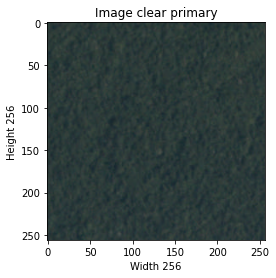

In [ ]:
label = tags[0]

img_np = img_vis(label, 0)

plt.title(f'Image {label}')
plt.ylabel('Height {}'.format(img_np.shape[0]))
plt.xlabel('Width {}'.format(img_np.shape[1]))
plt.imshow(img_np);

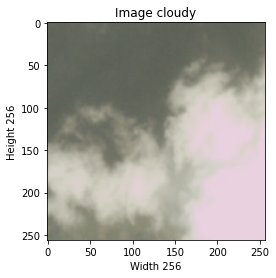

In [ ]:
label = tags[1]

img_np = img_vis(label, 0)

plt.title(f'Image {label}')
plt.ylabel('Height {}'.format(img_np.shape[0]))
plt.xlabel('Width {}'.format(img_np.shape[1]))
plt.imshow(img_np);

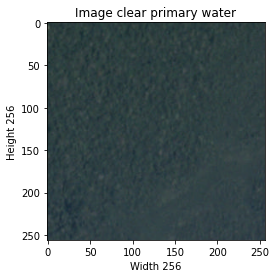

In [ ]:
label = tags[0]

img_np = img_vis(label, 0)

plt.title(f'Image {label}')
plt.ylabel('Height {}'.format(img_np.shape[0]))
plt.xlabel('Width {}'.format(img_np.shape[1]))
plt.imshow(img_np);

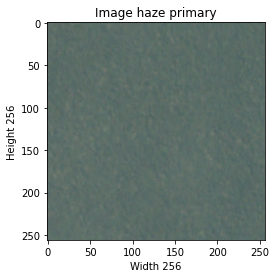

In [ ]:
label = tags[3]

img_np = img_vis(label, 0)

plt.title(f'Image {label}')
plt.ylabel('Height {}'.format(img_np.shape[0]))
plt.xlabel('Width {}'.format(img_np.shape[1]))
plt.imshow(img_np);

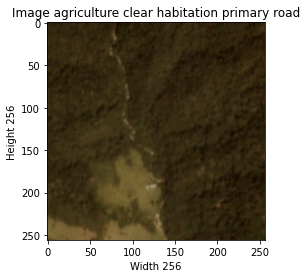

In [ ]:
label = tags[4]

img_np = img_vis(label, 0)

plt.title(f'Image {label}')
plt.ylabel('Height {}'.format(img_np.shape[0]))
plt.xlabel('Width {}'.format(img_np.shape[1]))
plt.imshow(img_np);

# 5. Sample

## 5.1 Random sampling

In [ ]:
seed = 25
n = 1125

samp_df = (data_info_filtered_df
           .groupby('tags', group_keys=False)
           .apply(lambda x: x.sample(n))
)

samp_df

,image_name,tags,path
24744,train_24744,agriculture clear habitation primary road,/content/drive/MyDrive/Colab Notebooks/amazon/...
4146,train_4146,agriculture clear habitation primary road,/content/drive/MyDrive/Colab Notebooks/amazon/...
25125,train_25125,agriculture clear habitation primary road,/content/drive/MyDrive/Colab Notebooks/amazon/...
22687,train_22687,agriculture clear habitation primary road,/content/drive/MyDrive/Colab Notebooks/amazon/...
32323,train_32323,agriculture clear habitation primary road,/content/drive/MyDrive/Colab Notebooks/amazon/...
...,...,...,...
11221,train_11221,haze primary,/content/drive/MyDrive/Colab Notebooks/amazon/...
23431,train_23431,haze primary,/content/drive/MyDrive/Colab Notebooks/amazon/...
7159,train_7159,haze primary,/content/drive/MyDrive/Colab Notebooks/amazon/...
31958,train_31958,haze primary,/content/drive/MyDrive/Colab Notebooks/amazon/...


## 5.2 Split data

In [ ]:
X = samp_df.path

le = preprocessing.LabelEncoder()
y = le.fit_transform(samp_df['tags']).reshape(-1, 1)

seed = 64

# train-test split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.1,
                                                    random_state=seed,
                                                    stratify=y)

In [ ]:
labels = list(le.inverse_transform([0, 1, 2, 3, 4]))

labels

['agriculture clear habitation primary road',
 'clear primary',
 'clear primary water',
 'cloudy',
 'haze primary']

In [ ]:
file_path = f'{working_path}/y_train.npy'

np.save(file_path, y_train)

In [ ]:
file_path = f'{working_path}/y_test.npy'

np.save(file_path, y_test)

# 6. Load data

In [ ]:
size_width = 4
size_height = 4

In [ ]:
def load_data(img_path: pd.Series, width: int = size_width, height: int = size_height) -> np.ndarray:
    len_vec = width * height
    
    img_path_list = img_path.to_list()
    len_path_list = len(img_path_list)

    img_list_all = []
    for i in range(len_path_list):
        img = Image.open(img_path_list[i])
        img = img.convert('RGB').resize((width, height))
        img = np.asarray(img) / 255.0
        img_list_all.append(img)

        print( i / len_path_list)
        
    img_array = np.array(img_list_all)

    return img_array

In [ ]:
# load traing img
X_train_img = load_data(X_train)

In [ ]:
X_train_img.shape

(5062, 4, 4, 3)

In [ ]:
file_path = f'{working_path}/X_train_img.npy'

np.save(file_path, X_train_img)

In [ ]:
# load test img
X_test_img = load_data(X_test)

In [ ]:
X_test_img.shape

(563, 4, 4, 3)

In [ ]:
file_path = f'{working_path}/X_test_img.npy'

np.save(file_path, X_test_img)

# 7. Filters

## 7.1 False NDVI

In [ ]:
def false_nvdi(np_array: any, k: float = 2) -> any:
    red_channel = np_array[:, :, :, 0]
    blue_channel = np_array[:, :, :, 2]

    result = (k * red_channel - blue_channel) / (blue_channel)

    return result

In [ ]:
result_false_nvdi = false_nvdi(X_train_img)

In [ ]:
flat_result_false_nvdi = result_false_nvdi.reshape((-1, size_height*size_width))

In [ ]:
y_train = y_train.reshape((-1))
y_train_label = le.inverse_transform(y_train)

y_train_label

array(['agriculture clear habitation primary road', 'haze primary',
       'agriculture clear habitation primary road', ...,
       'agriculture clear habitation primary road', 'clear primary',
       'agriculture clear habitation primary road'], dtype=object)

In [ ]:
list_false_ndvi = list(zip(list(flat_result_false_nvdi), y_train_label))

In [ ]:
false_ndvi_col = 'false_ndvi'
label_col = 'label'

In [ ]:
df_false_ndvi = pd.DataFrame(data=list_false_ndvi, columns=[false_ndvi_col, label_col])

df_false_ndvi = df_false_ndvi.explode(false_ndvi_col)

df_false_ndvi = df_false_ndvi.reset_index()

df_false_ndvi.head()

,index,false_ndvi,label
0,0,1.31429,agriculture clear habitation primary road
1,0,1.2,agriculture clear habitation primary road
2,0,1.25,agriculture clear habitation primary road
3,0,1.43038,agriculture clear habitation primary road
4,0,1.22222,agriculture clear habitation primary road


In [ ]:
df_false_ndvi_out = (df_false_ndvi[df_false_ndvi.groupby(label_col)[false_ndvi_col]
                                   .transform(lambda x : (x<x.quantile(0.95))&(x>(x.quantile(0.05))))
                                   .eq(1)])

In [ ]:
df_false_ndvi_norm = df_false_ndvi_out
df_false_ndvi_norm[false_ndvi_col] = df_false_ndvi_out[false_ndvi_col] / df_false_ndvi_out[false_ndvi_col].max()

df_false_ndvi_norm.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,false_ndvi,label
0,0,0.471981,agriculture clear habitation primary road
1,0,0.430939,agriculture clear habitation primary road
2,0,0.448895,agriculture clear habitation primary road
3,0,0.513672,agriculture clear habitation primary road
4,0,0.43892,agriculture clear habitation primary road


In [ ]:
fig = df_false_ndvi_out.plot(kind='box',
                             x=label_col,
                             y=false_ndvi_col,
                             color=label_col
                             )

fig.update_xaxes(title='label', visible=True, showticklabels=False)

fig.write_html(f'{fig_path}/(03)box_false_ndvi.html')

fig

## 7.2 VARI

In [ ]:
def vari(np_array: any) -> any:
    red_channel = np_array[:, :, :, 0]
    green_channel = np_array[:, :, :, 1]
    blue_channel = np_array[:, :, :, 2]

    num = green_channel - red_channel
    den = green_channel + red_channel - blue_channel

    result = np.divide(num, den, out=np.zeros_like(num), where = den != 0)

    return result

In [ ]:
result_vari = vari(X_train_img)

In [ ]:
flat_result_vari = result_vari.reshape((-1, size_height*size_width))

In [ ]:
y_train = y_train.reshape((-1))
y_train_label = le.inverse_transform(y_train)

y_train_label

array(['agriculture clear habitation primary road', 'haze primary',
       'agriculture clear habitation primary road', ...,
       'agriculture clear habitation primary road', 'clear primary',
       'agriculture clear habitation primary road'], dtype=object)

In [ ]:
list_vari = list(zip(list(flat_result_vari), y_train_label))

In [ ]:
vari_col = 'vari'
label_col = 'label'

In [ ]:
df_vari = pd.DataFrame(data=list_vari, columns=[vari_col, label_col])

df_vari = df_vari.explode(vari_col)

df_vari = df_vari.reset_index()

df_vari.head()

,index,vari,label
0,0,0.0707071,agriculture clear habitation primary road
1,0,0.134021,agriculture clear habitation primary road
2,0,0.108911,agriculture clear habitation primary road
3,0,0.0504202,agriculture clear habitation primary road
4,0,0.111111,agriculture clear habitation primary road


In [ ]:
df_vari_out = (df_vari[df_vari.groupby(label_col)[vari_col]
                       .transform(lambda x : (x<x.quantile(0.95))&(x>(x.quantile(0.05))))
                       .eq(1)])

In [ ]:
df_vari_norm = df_vari_out
df_vari_norm[vari_col] = df_vari_out[vari_col] / df_vari_out[vari_col].max()

df_vari_norm.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,vari,label
0,0,0.163743,agriculture clear habitation primary road
1,0,0.310364,agriculture clear habitation primary road
2,0,0.252215,agriculture clear habitation primary road
3,0,0.116762,agriculture clear habitation primary road
4,0,0.25731,agriculture clear habitation primary road


In [ ]:
df_vari_norm.shape

(72866, 1)

In [ ]:
fig = df_vari_out.plot(kind='box',
                             x=label_col,
                             y=vari_col,
                             color=label_col
                             )

fig.update_xaxes(title='label', visible=True, showticklabels=False)

fig.write_html(f'{fig_path}/(04)box_vari.html')

fig

## 7.3 Correlation

In [ ]:
index_col = 'index'

In [ ]:
df_vari_norm = df_vari_norm.drop(columns=[index_col, label_col])

In [ ]:
df_false_ndvi_norm = df_false_ndvi_norm.drop(columns=index_col)

In [ ]:
df_join = df_vari_norm.join(df_false_ndvi_norm, how='inner')

In [ ]:
fig = df_join.plot(kind='scatter',
                   x = 'false_ndvi',
                   y = 'vari',
                   color = 'label',
                   opacity = 0.5
                   )

fig.update_layout(yaxis=dict(range=[-0.4, 1]), 
                  xaxis=dict(range=[0.1, 1]))

fig.write_html(f'{fig_path}/(05)scat_filt.html')

fig

# 8. Kruskal-Wallis

In [ ]:
df_join_0 = df_join[df_join.label == labels[0]]
df_join_1 = df_join[df_join.label == labels[1]]
df_join_2 = df_join[df_join.label == labels[2]]
df_join_3 = df_join[df_join.label == labels[3]]
df_join_4 = df_join[df_join.label == labels[4]]

## 8.1 False NDVI

In [ ]:
stats.kruskal(df_join_0.false_ndvi, 
              df_join_1.false_ndvi,
              df_join_2.false_ndvi,
              df_join_3.false_ndvi,
              df_join_4.false_ndvi
              )

KruskalResult(statistic=30348.11881366107, pvalue=0.0)

## 8.2 VARI

In [ ]:
stats.kruskal(df_join_0.vari, 
              df_join_1.vari,
              df_join_2.vari,
              df_join_3.vari,
              df_join_4.vari
              )

KruskalResult(statistic=37178.503533563126, pvalue=0.0)

# 9. Gaussian Naive Bayes

## 9.1 Split data

In [ ]:
le_nb = preprocessing.LabelEncoder()
y_nb = le_nb.fit_transform(df_join[label_col])

X_nb = df_join[[vari_col, false_ndvi_col]]

In [ ]:
labels_nb = le_nb.inverse_transform([0, 1, 2, 3, 4])

labels_nb[0] = 'agriculture...'

labels_nb

array(['agriculture...', 'clear primary', 'clear primary water', 'cloudy',
       'haze primary'], dtype=object)

In [ ]:
seed = 74

X_train_nb, X_test_nb, y_train_nb, y_test_nb = train_test_split(X_nb,
                                                    y_nb,
                                                    test_size=0.1,
                                                    random_state=seed,
                                                    stratify=y_nb)

## 9.2 Fit

In [ ]:
gnb = GaussianNB()

In [ ]:
y_pred_nb = gnb.fit(X_train_nb, y_train_nb).predict(X_test_nb)

## 9.3 Results

In [ ]:
# get metric
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_nb, y_pred_nb, normalize='true')

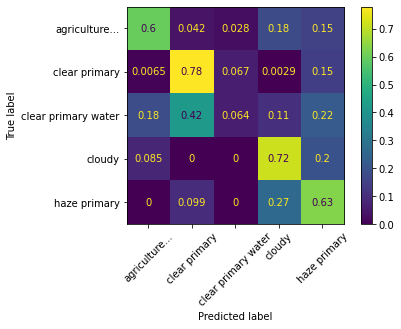

In [ ]:
# display matrix
matrix_plot = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix, labels_nb)

matrix_plot.plot(xticks_rotation=45);